In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import glob
import pickle
from moviepy.editor import VideoFileClip
%matplotlib inline

# Image Distortion
Image distortion occurs when a camera looks at 3D objects in the real world and transforms them into a 2D image; this transformation isn’t perfect. Distortion actually changes what the shape and size of these 3D objects appear to be. So, the first step in analyzing camera images,is to undo this distortion so that 
you can get correct and useful information out of them.

We are using a chessboard for calibration because of its regular high contrast pattern makes it easy to detect
automatically.
- Use Pictures taken on a flat surface.
- Distortion calculation by looking at the difference between the apparent size and shape of the square in these images and the size and shape they actually are.
- Use this information to calibrate our camera
  - Create a transform that maps these distorted points to undistorted points.
  - Finally, undistort any images.


# Finding Corners

Count the number of corners in any given row and enter that value in `nx`. Similarly, count the number of corners in a given column and store that in `ny`. 
Keep in mind that "corners" are only points where two black and two white squares intersect, in other words, only count inside corners, not outside corners.

# 1. Camera Calibration

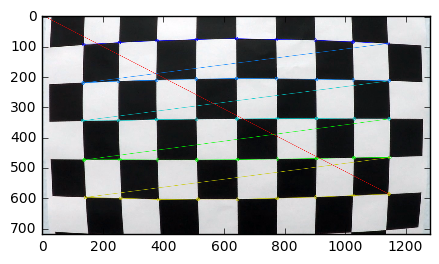

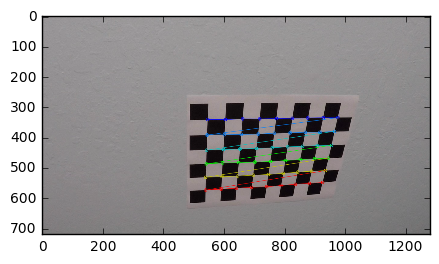

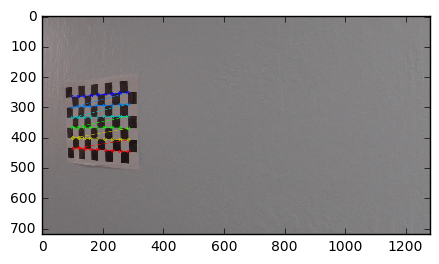

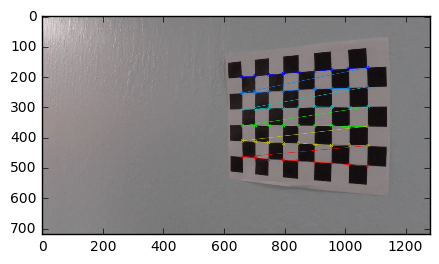

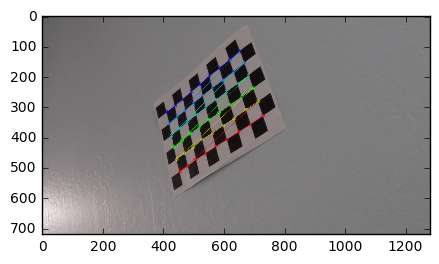

...

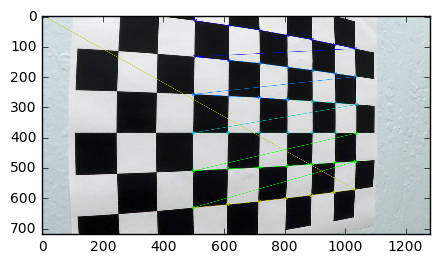

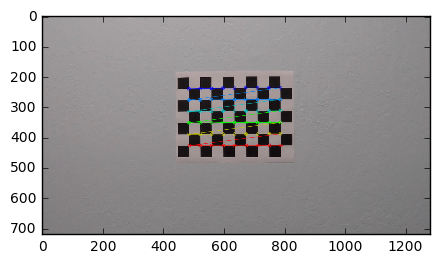

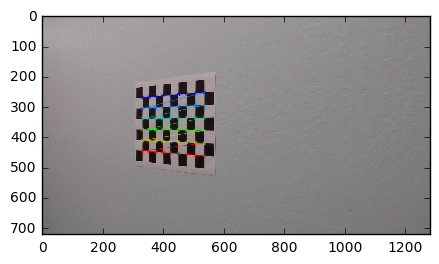

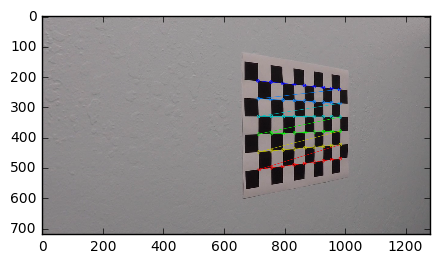

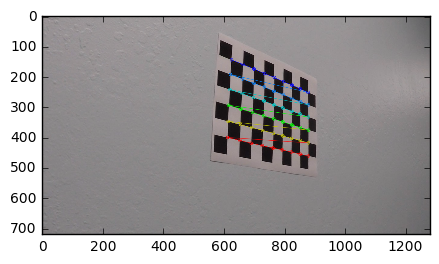

In [18]:
'''
Function to obtain the object points given number of corners in x and y directions.
We have 9*6 corners to detect.
Object points will be 3D coordinates, x, y and z from the top left corner, (0,0,0) to the bottom right 
(8,5,0) `z` coordinate will be zero for every point since the board is on a flat image plane. 
`x` and `y` will be all the coordinates of the corners.
'''

def get_objp(nx, ny):
    
    '''
    Prepare object points like (0,0,0) (1,0,0)....(8,5,0)
    Numpy array each with 3 columns for `x`,`y`, `z` coordinates of each corner.
    All are initialized to zero.`mgrid` function to generate our required coordinates.
    `mgrid` returns the coordinate values for a given grid size and shape those columns back into 
    2 columns one for `x` and one for `y`.
    '''
    
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
    return objp

# Function to calibrate camera given calibration images
def camera_calibration(directory, nx, ny, draw = False):
    
    '''
    Read in all the calibration images importing `glob` API. 
    Helps read in images with the consistent file names like calibration 1,2,3 and so on.
    '''
    
    images = glob.glob(os.path.join(directory, 'calibration*.jpg'))
    
    '''
    Map the cordinates of the corners in the 2D image, which I have taken as image points to the 
    3D cordinates of the real,undistorted chessboard corners, which I have taken as object points.
    Hence 2 empty arrays to hold the object points and image points.
    '''
    
    objpoints = [] # 3D points in the real world space
    imgpoints = [] # 2D points in the image plane
    
    for fname in images:
        img = cv2.imread(fname)
        
        # Convert image to grayscale to find the chess board corners.
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Find Chessboard corners, last parameter is for `flags` which is None in this case.
        # Try nx and ny first, then reduces the numbers if not found.
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        
        objp = get_objp(nx, ny)
        if ret is False:
            ret, corners = cv2.findChessboardCorners(gray, (nx - 1, ny), None)
            objp = get_objp(nx - 1, ny)
        if ret is False:
            ret, corners = cv2.findChessboardCorners(gray, (nx, ny - 1), None)
            objp = get_objp(nx, ny - 1)
        if ret is False:
            ret, corners = cv2.findChessboardCorners(gray, (nx - 1, ny - 1), None)
            objp = get_objp(nx - 1, ny - 1)
        if ret is False:
            ret, corners = cv2.findChessboardCorners(gray, (nx - 2, ny), None)
            objp = get_objp(nx - 2, ny)
        if ret is False:
            ret, corners = cv2.findChessboardCorners(gray, (nx, ny - 2), None)
            objp = get_objp(nx, ny - 2)
        if ret is False:
            ret, corners = cv2.findChessboardCorners(gray, (nx - 2, ny - 2), None)
            objp = get_objp(nx - 2, ny - 2)
            
        if ret is True:
            
            # Append the points to the image points array
            imgpoints.append(corners)
            
            # Add the prepared object points array `objp` to the object points array
            objpoints.append(objp)
            
            # Draw and display the corners
            if draw is True:
                
                # Function parameters are image, corner dimensions, corner points
                img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
                plt.figure(figsize=(5,4))
                plt.imshow(img)
                plt.show()
        else:
            print('Could not find corners from %s' %fname)
    
    '''
    Use object points and Image points to calibrate the camera.
    Calculates and returns the distortion co-efficient `dist`, camera matrix `mtx` needed to 
    transform the 3D object points to 2D image points.
    It also returns the position of the camera in the world, with values for rotation and 
    translation vectors.
    '''
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    
    return mtx, dist

mtx, dist = camera_calibration(directory = 'camera_cal/', nx = 9, ny = 6, draw = True)

## Save the camera calibration result as a pickle

In [3]:
cal_pickle = {}
cal_pickle['mtx'] = mtx
cal_pickle['dist'] = dist
with open('camera_cal/cal_pickle.p','wb') as output_file:
    pickle.dump(cal_pickle, output_file)

## Load the camera calibration pickle

In [4]:
with open('camera_cal/cal_pickle.p', 'rb') as input_file:
    p = pickle.load(input_file)
mtx = p['mtx']
dist = p['dist']

# 2. Distortion Correction

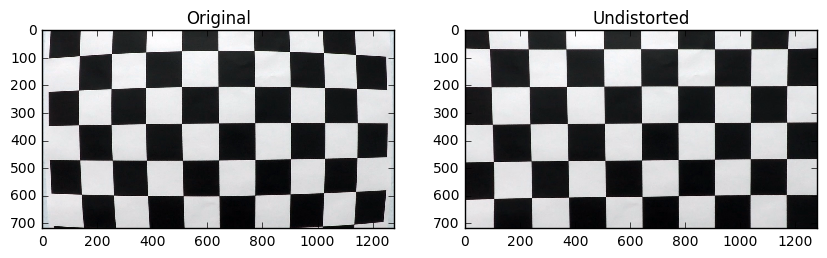

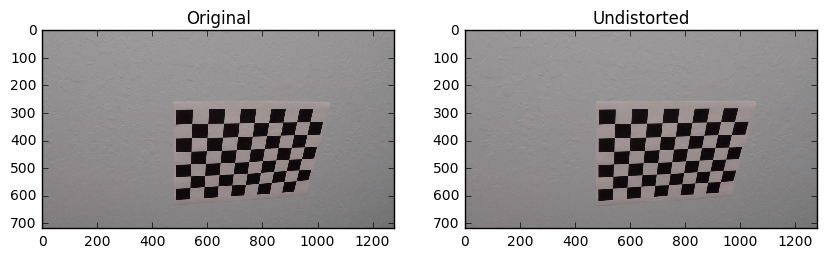

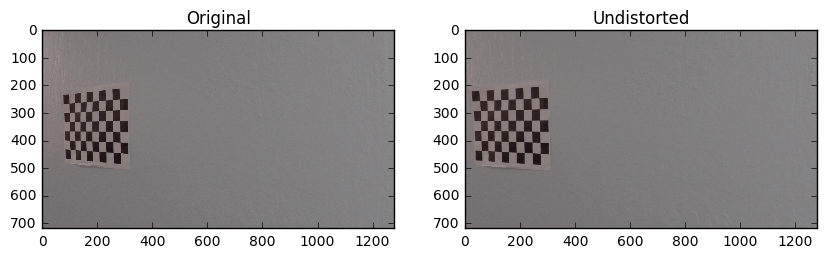

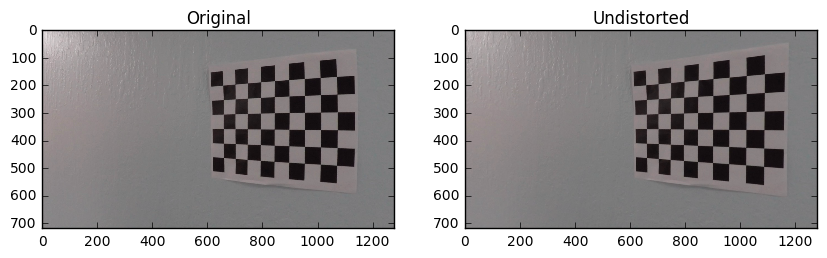

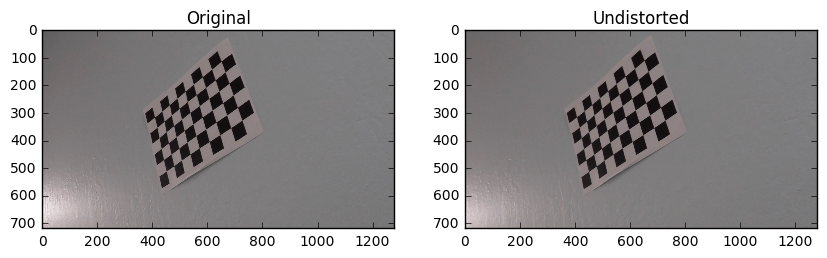

...

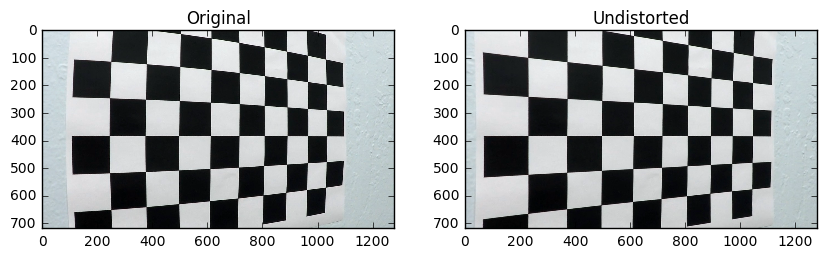

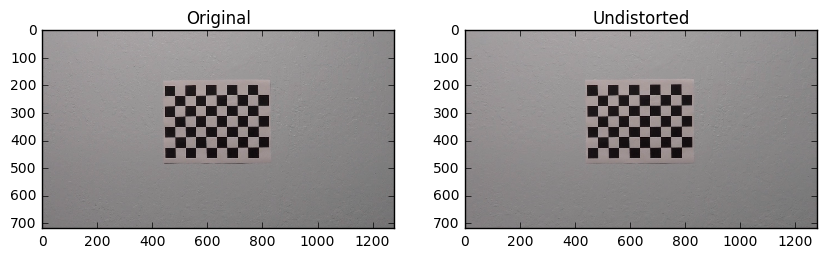

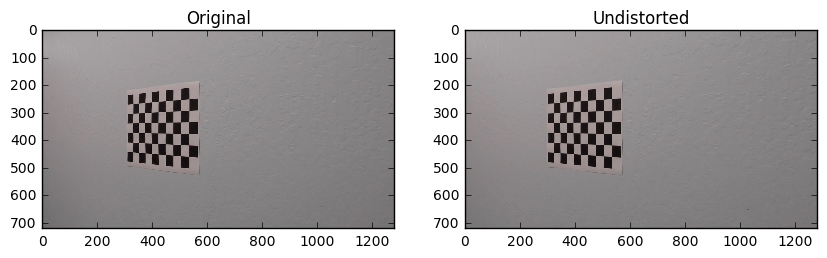

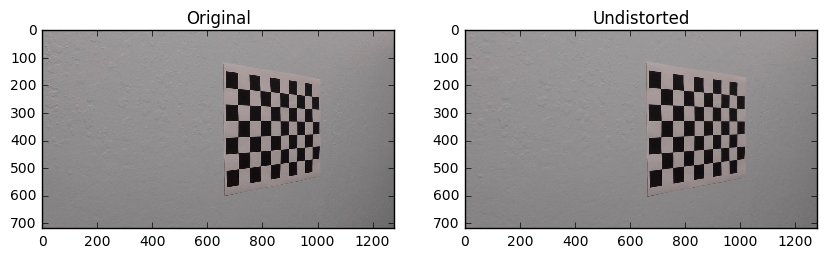

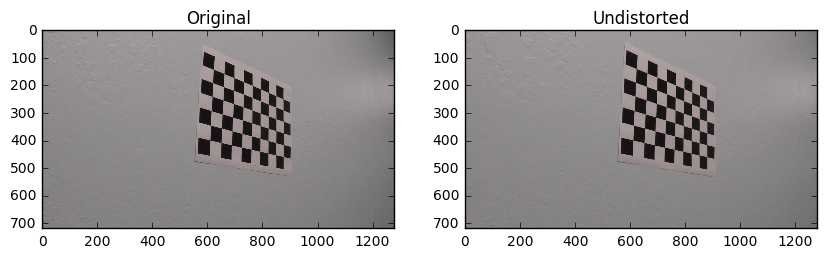

In [5]:
# Try distortion on calibration images first
cal_imgs = glob.glob(os.path.join('camera_cal/', 'calibration*'))
for fname in cal_imgs:
    img = cv2.imread(fname)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    f, ax = plt.subplots(1, 2, figsize=(10,8))
    ax[0].imshow(img)
    ax[0].set_title('Original')
    ax[1].imshow(undist)
    ax[1].set_title('Undistorted')
plt.show()

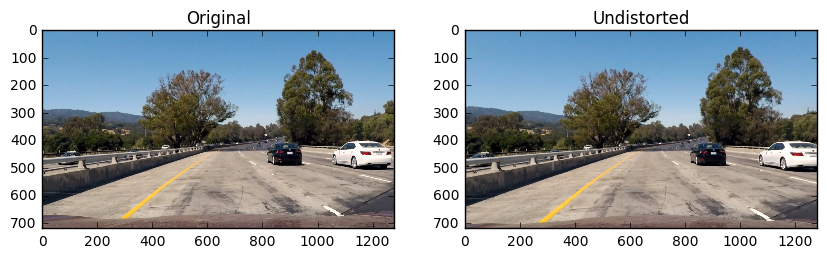

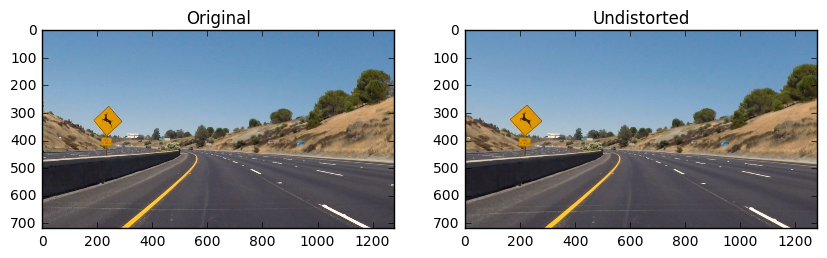

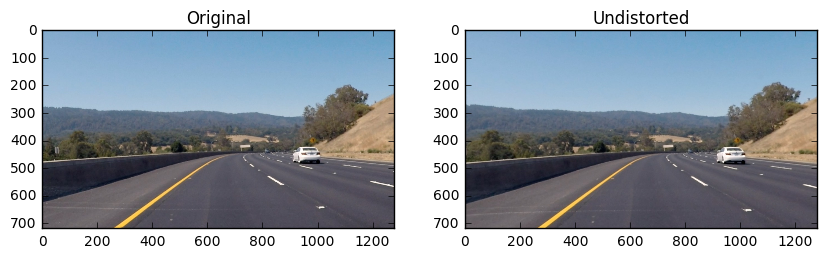

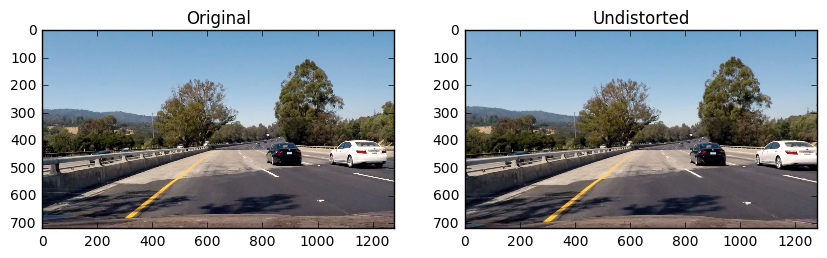

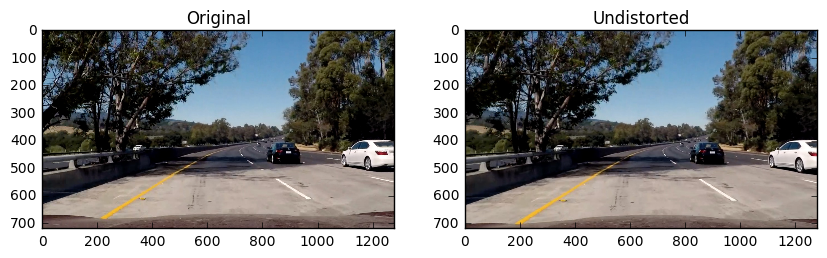

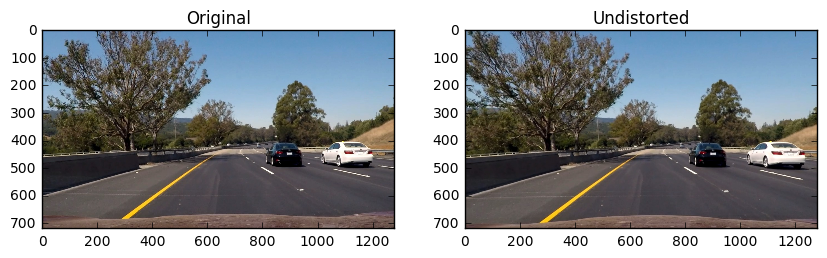

In [6]:
# Grab all the test images
test_imgs = glob.glob(os.path.join('test_images/', 'test*.jpg'))
for fname in test_imgs:
    # Get the original image
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    # Get the undistorted image
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    f, ax = plt.subplots(1, 2, figsize=(10, 8))
    ax[0].imshow(img)
    ax[0].set_title('Original')
    ax[1].imshow(undist)
    ax[1].set_title('Undistorted')
plt.show()

# 3. Perspective Transform

First, transfrom on the undistorted figures.

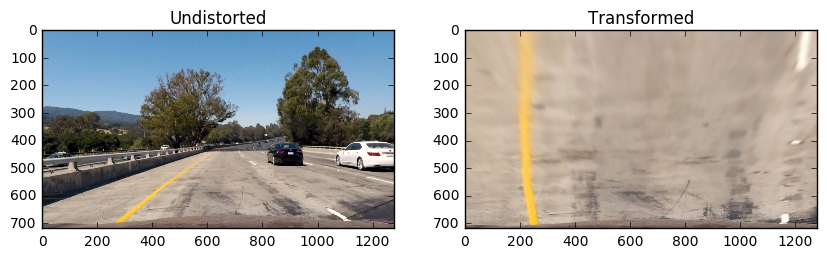

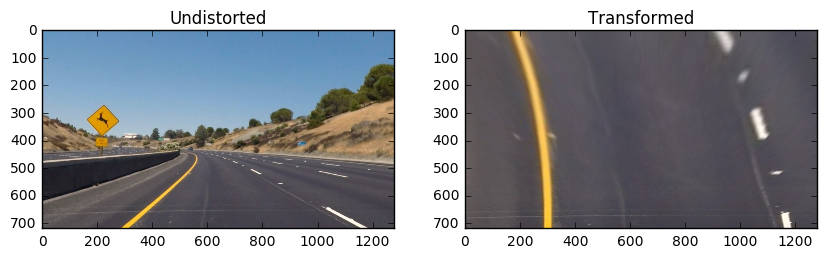

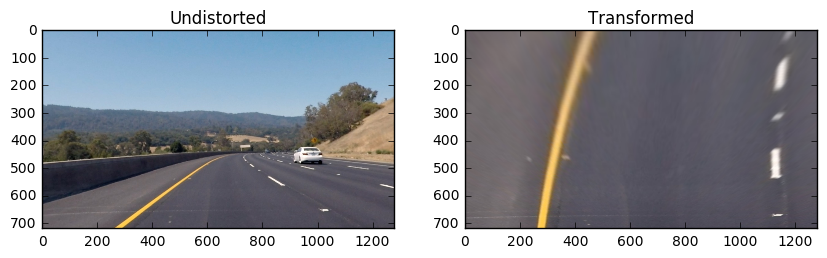

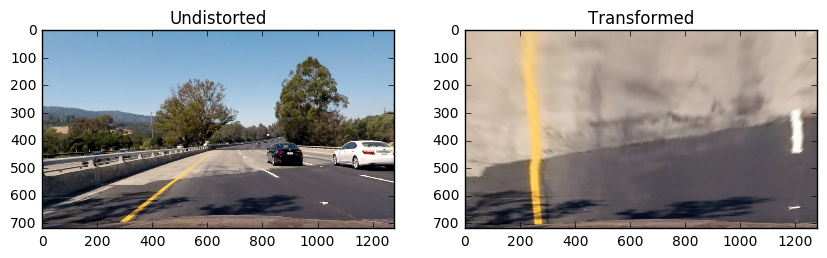

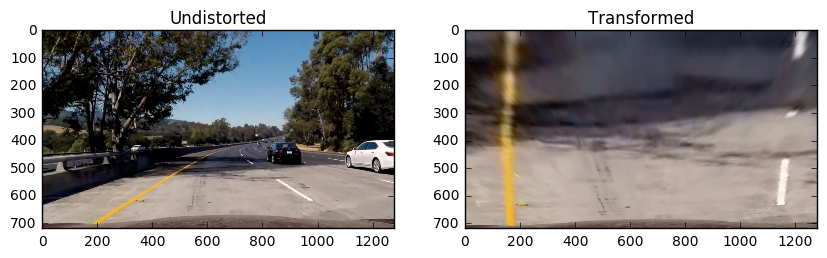

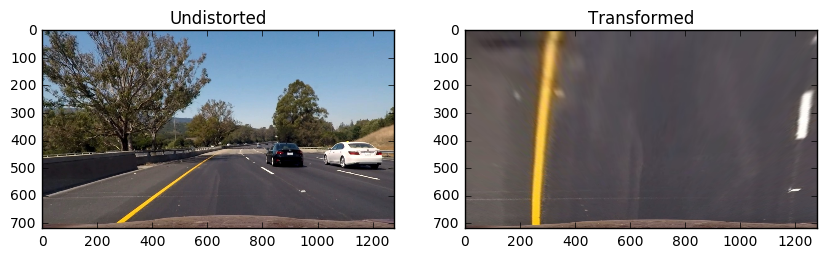

In [7]:
# Hard coded number for the images
src = np.float32([(300,720),(1100,720),(730,480),(580,480)])
dst = np.float32([(300,720),(1100,720),(1100,0),(300,0)])

# Function to get the M and M inverse matrix for perspective transform
def PerspectiveTransform(src, dst):
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    return M, Minv

# Get the transform matrices 
M, Minv = PerspectiveTransform(src, dst)

# Grab all the test images
test_imgs = glob.glob(os.path.join('test_images/', 'test*.jpg'))
for fname in test_imgs:
    # Get the original image
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    undist = cv2.undistort(img, mtx, dist, None, mtx)    
    birdseye = cv2.warpPerspective(undist, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    f, ax = plt.subplots(1, 2, figsize=(10,8))
    ax[0].imshow(undist)
    ax[0].set_title('Undistorted')
    ax[1].imshow(birdseye)
    ax[1].set_title('Transformed')
plt.show()

# 4. Thresholding

In [8]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient = 'x', thresh_min = 0, thresh_max = 255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    elif orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy of the image
    binary = np.zeros_like(scaled_sobel)
    # Apply the threshold
    binary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return binary

def thresholding(img, s_thresh=(170, 255), sx_thresh=(30, 255)):   
    # Sobel x 
    sobel_x = abs_sobel_thresh(img, 'x', 30, 255)
    
    # White and yellow from RGB
    rgb_white = cv2.inRange(img, (200, 200, 200), (255, 255, 255))
    rgb_yellow = cv2.inRange(img, (20, 100, 100), (50, 255, 255))
    
    # White and yellow from HSV
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    hsv_white = cv2.inRange(hsv, (200, 200, 200), (255, 255, 255))
    hsv_yellow = cv2.inRange(hsv, (20, 100, 100), (50, 255, 255))
    
    # S channel from HLS
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]
    s_output = np.zeros_like(s)
    s_output[(s > 170) & (s <= 255)] = 1
    
    # White and yellow from HLS
    hls_white = cv2.inRange(hls, (200,200,200), (255,255,255))
    hls_yellow = cv2.inRange(hls, (20, 100, 100), (50, 255, 255))

    masked = sobel_x | s_output | rgb_white | rgb_yellow | hsv_white | hsv_yellow | hls_white | hls_yellow
    return masked    

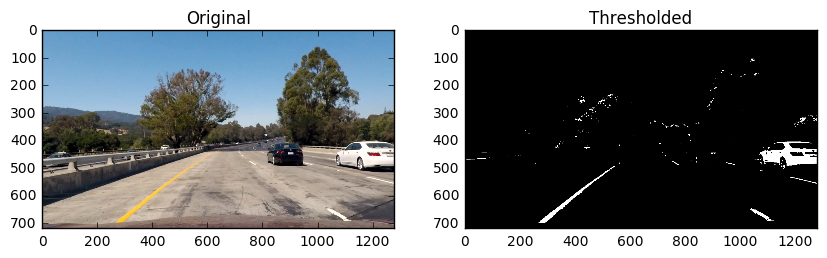

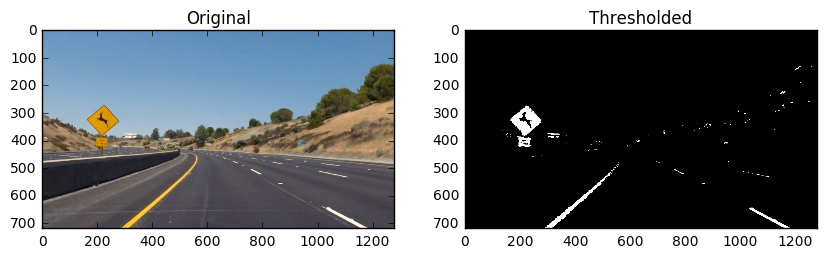

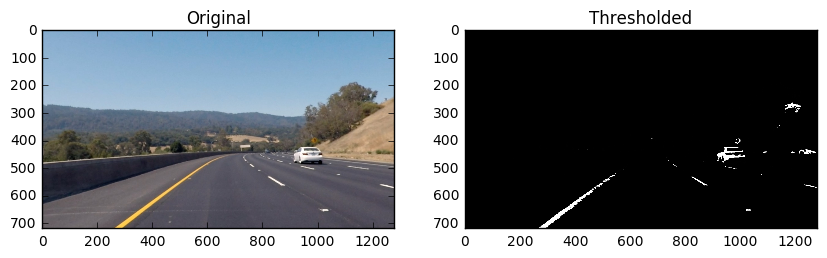

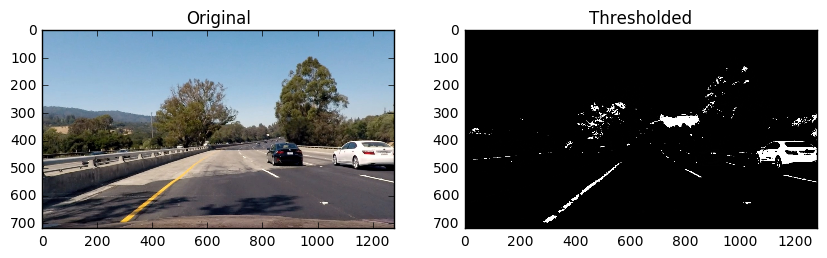

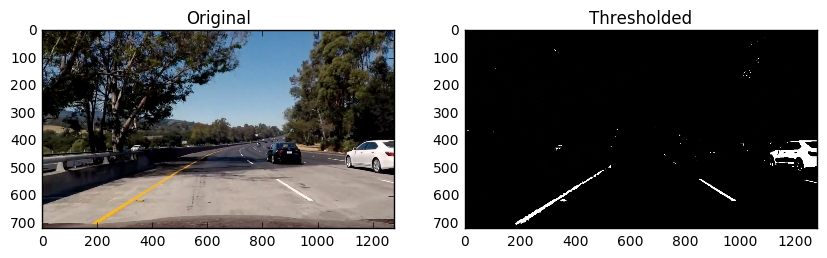

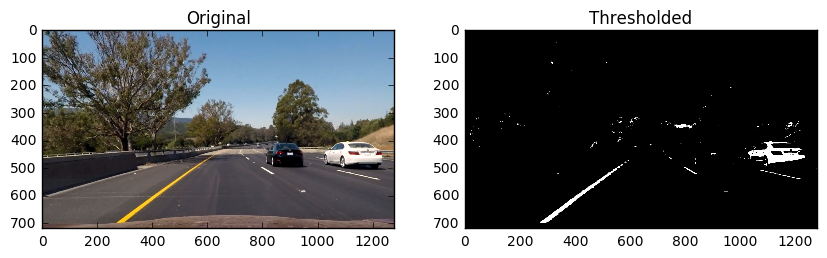

In [9]:
# Grab all the test images
test_imgs = glob.glob(os.path.join('test_images/', 'test*.jpg'))
for fname in test_imgs:
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    masked = thresholding(undist)
    f, ax = plt.subplots(1, 2, figsize=(10,8))
    ax[0].imshow(undist)
    ax[0].set_title('Original')
    ax[1].imshow(masked, cmap = 'gray')
    ax[1].set_title('Thresholded')
    plt.show()

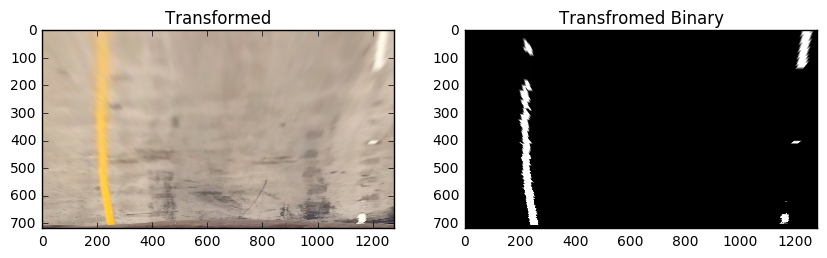

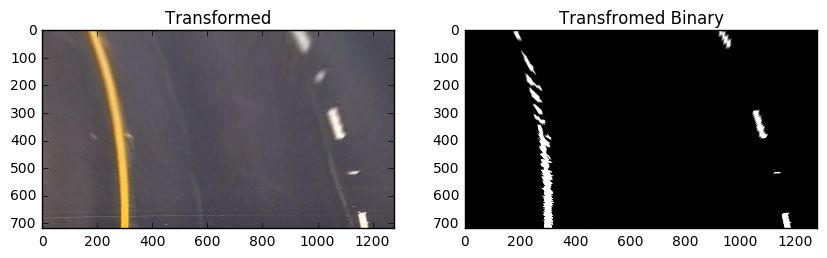

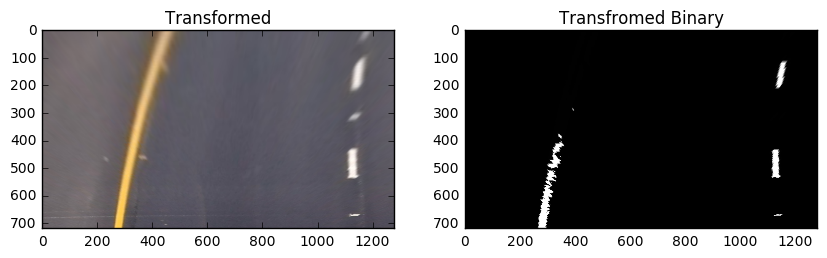

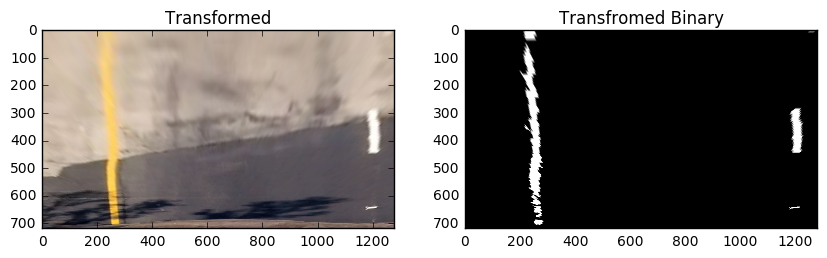

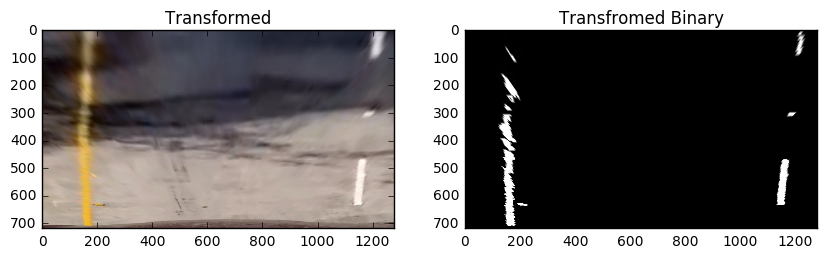

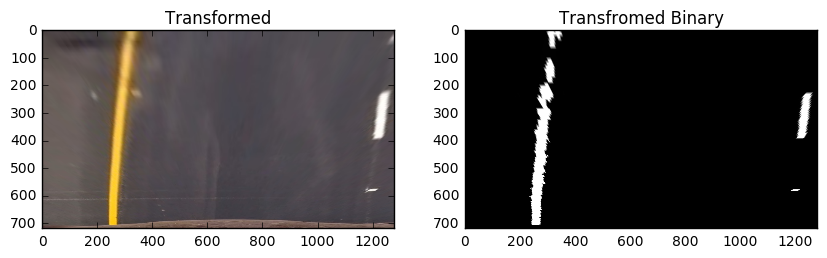

In [10]:
# Grab all the test images
test_imgs = glob.glob(os.path.join('test_images/', 'test*.jpg'))
for fname in test_imgs:
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    masked = thresholding(undist)
    transformed = cv2.warpPerspective(undist, M, (1280, 720), flags=cv2.INTER_LINEAR)
    binary_transformed = cv2.warpPerspective(masked, M, (1280, 720), flags=cv2.INTER_LINEAR)
    f, ax = plt.subplots(1, 2, figsize=(10,8))
    ax[0].imshow(transformed)
    ax[0].set_title('Transformed')
    ax[1].imshow(binary_transformed, cmap = 'gray')
    ax[1].set_title('Transfromed Binary')
    plt.show()

# 5. Lane Detection

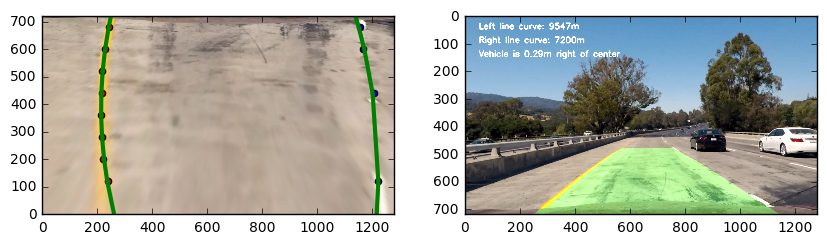

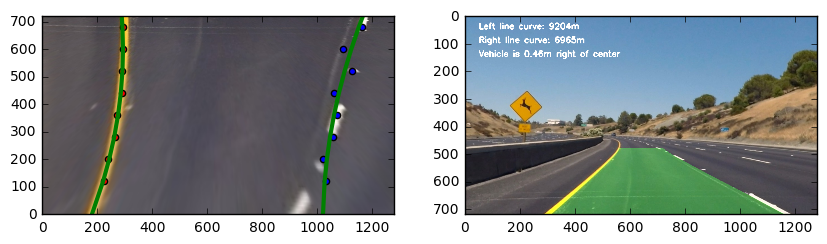

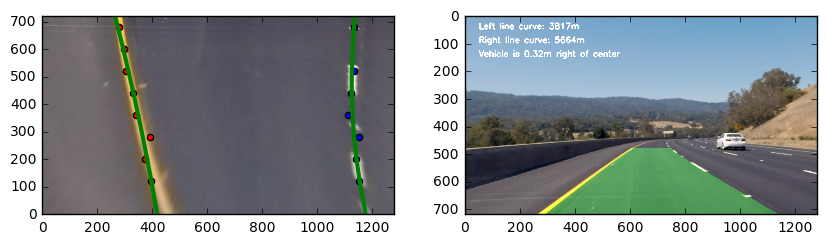

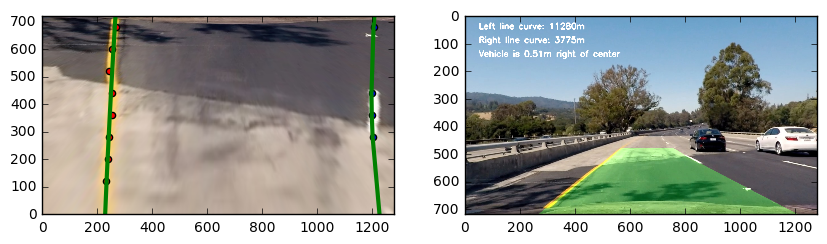

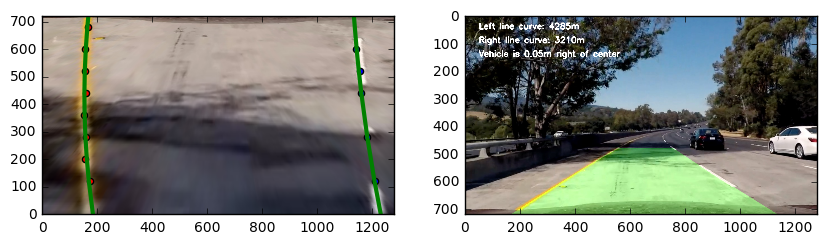

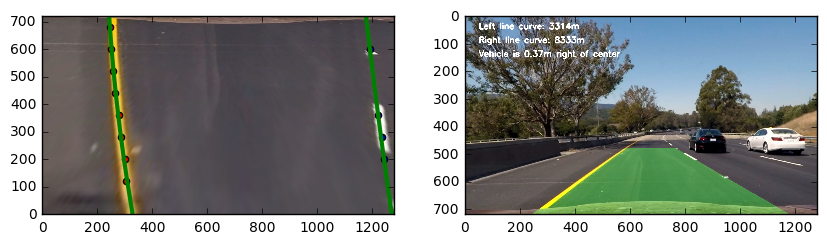

In [11]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meteres per pixel in x dimension

# Function to find max value and index for an array from left to right
def FindMaxInd(array, left, right):
    max_value, max_ind = 0, 0
    for i in range(left, right):
        if array[i] > max_value:
            max_value, max_ind = array[i], i
    return max_value, max_ind

# Function to reject the point outliers by comparing to the median value
def RejectOutlier(x_array, y_array):
    median = np.median(x_array)
    dev = x_array - median
    ind = []
    for i, x in enumerate(dev):
        if abs(x) > 200:
            ind.append(i)
    x_array = np.delete(x_array, ind)
    y_array = np.delete(y_array, ind)
    return x_array, y_array

# Function to find the lines from the points
def FindLines(img, undist, step):
    left = []
    right = []
    center = int(img.shape[1]/2)
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    for i in range(img.shape[1] - step, 0, -step):
        histogram = np.sum(img[i:i+step,:], axis = 0)
        left_max_var, left_max_ind = FindMaxInd(histogram, 0, center)
        right_max_var, right_max_ind = FindMaxInd(histogram, center, img.shape[1])
        if(left_max_var > 0):
            left.append((left_max_ind, int((i+i+step)/2)))
        if(right_max_var > 0):
            right.append((right_max_ind, int((i+i+step)/2)))

    left_x = np.array([item[0] for item in left])
    left_y = np.array([item[1] for item in left])
    left_x, left_y = RejectOutlier(left_x, left_y)
    left_fit = np.polyfit(left_y, left_x, 2)
    left_y_ext = np.append(left_y, 0)
    left_y_ext = np.append(720, left_y_ext)
    left_fitx = left_fit[0]*left_y_ext**2 + left_fit[1]*left_y_ext + left_fit[2]
    
    right_x = np.array([item[0] for item in right])
    right_y = np.array([item[1] for item in right])
    right_x, right_y = RejectOutlier(right_x, right_y)
    right_fit = np.polyfit(right_y, right_x, 2)
    right_y_ext = np.append(right_y, 0)
    right_y_ext = np.append(720, right_y_ext)
    right_fitx = right_fit[0]*right_y_ext**2 + right_fit[1]*right_y_ext + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, left_y_ext]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, right_y_ext])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
     # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    yval = img.shape[1]
    left_fit_cr = np.polyfit(left_y*ym_per_pix, left_x*xm_per_pix, 2)
    right_fit_cr = np.polyfit(right_y*ym_per_pix, right_x*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_cr[0]*yval + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*yval + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result, 'Left line curve: %dm' % left_curverad, (50,50), font, 1,(255,255,255),3)
    cv2.putText(result, 'Right line curve: %dm' % right_curverad, (50,100), font, 1,(255,255,255),3)
    
    lane_middle = left_fitx[0] + (right_fitx[0] - left_fitx[0])/2.0
    deviation = (lane_middle - 640)*xm_per_pix
    if deviation >= 0:
        cv2.putText(result, 'Vehicle is %.2fm right of center' % deviation, (50,150), font, 1,(255,255,255),3)
    else:
        cv2.putText(result, 'Vehicle is %.2fm left of center' % -deviation, (50,150), font, 1,(255,255,255),3)
    ax[0].scatter(left_x, left_y, c = 'r')
    ax[0].scatter(right_x, right_y, c = 'b')
    ax[0].plot(left_fitx, left_y_ext, color='green', linewidth=3)
    ax[0].plot(right_fitx, right_y_ext, color='green', linewidth=3)
    
    return result, left_x, left_y, right_x, right_y, left_fitx, left_y_ext, right_fitx, right_y_ext

# Grab all the test images
test_imgs = glob.glob(os.path.join('test_images/', 'test*.jpg'))
for fname in test_imgs:
    # Get the original image
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    # Get the undistorted image
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    transformed = thresholding(undist)
    birdseye_undist = cv2.warpPerspective(undist, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    birdseye_transformed = cv2.warpPerspective(transformed, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    
    result, left_x, left_y, right_x, right_y, left_fitx, left_y_ext, right_fitx, right_y_ext = \
    FindLines(birdseye_transformed,undist, 80)
    
    f, ax = plt.subplots(1, 2, figsize=(10,8))
    ax[0].imshow(birdseye_undist)
    ax[0].scatter(left_x, left_y, c = 'r')
    ax[0].scatter(right_x, right_y, c = 'b')
    ax[0].plot(left_fitx, left_y_ext, color='green', linewidth=3)
    ax[0].plot(right_fitx, right_y_ext, color='green', linewidth=3)
    ax[0].set_xlim([0, 1280])
    ax[0].set_ylim([0, 720])
    ax[1].imshow(result)
    plt.show()

# 6. Form the pipeline

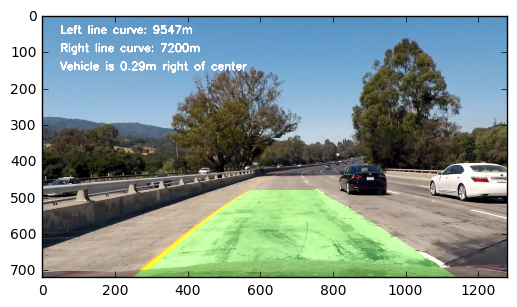

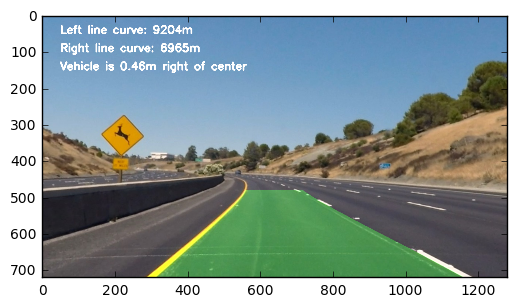

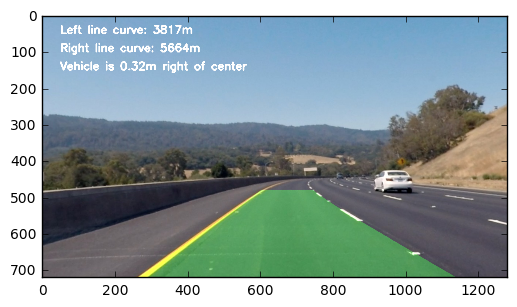

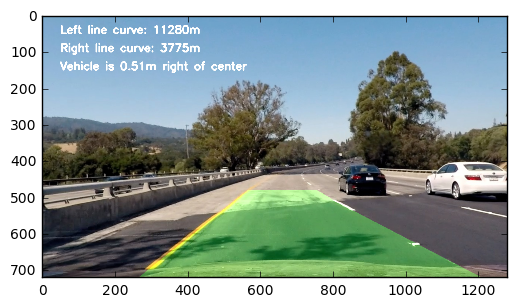

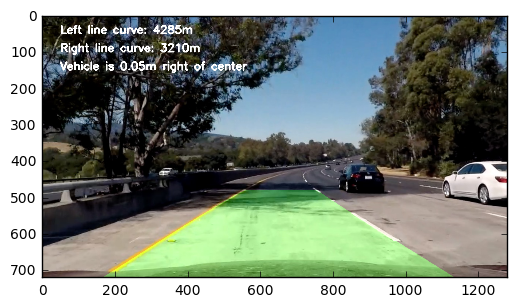

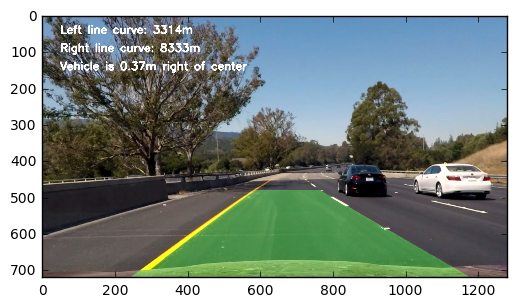

In [12]:
def pipeline(img):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    transformed = thresholding(undist)
    birdseye_transformed = cv2.warpPerspective(transformed, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    result, left_x, left_y, right_x, right_y, left_fitx, left_y_ext, right_fitx, right_y_ext = \
    FindLines(birdseye_transformed,undist, 80)
    return result

    
# Grab all the test images
test_imgs = glob.glob(os.path.join('test_images/', 'test*.jpg'))
for fname in test_imgs:
    img = cv2.cvtColor(cv2.imread(fname),cv2.COLOR_BGR2RGB)
    result = pipeline(img)
    plt.figure()
    plt.imshow(result)
    plt.show()

In [13]:
class Line():
    def __init__(self):
        self.left_pts = np.array(None)
        self.right_pts = np.array(None)
        self.left_curv = 1000
        self.right_curv = 1000
    def FindLines(self, img, undist, step):
        left = []
        right = []
        center = int(img.shape[1]/2)
        # Create an image to draw the lines on
        warp_zero = np.zeros_like(img).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
        for i in range(img.shape[1] - step, 0, -step):
            histogram = np.sum(img[i:i+step,:], axis = 0)
            left_max_var, left_max_ind = FindMaxInd(histogram, 0, center)
            right_max_var, right_max_ind = FindMaxInd(histogram, center, img.shape[1])
            if(left_max_var > 0):
                left.append((left_max_ind, int((i+i+step)/2)))
            if(right_max_var > 0):
                right.append((right_max_ind, int((i+i+step)/2)))

        left_x = np.array([item[0] for item in left])
        left_y = np.array([item[1] for item in left])
        left_x, left_y = RejectOutlier(left_x, left_y)
        left_fit = np.polyfit(left_y, left_x, 2)
        left_y_ext = np.append(left_y, 0)
        left_y_ext = np.append(720, left_y_ext)
        left_fitx = left_fit[0]*left_y_ext**2 + left_fit[1]*left_y_ext + left_fit[2]

        right_x = np.array([item[0] for item in right])
        right_y = np.array([item[1] for item in right])
        right_x, right_y = RejectOutlier(right_x, right_y)
        right_fit = np.polyfit(right_y, right_x, 2)
        right_y_ext = np.append(right_y, 0)
        right_y_ext = np.append(720, right_y_ext)
        right_fitx = right_fit[0]*right_y_ext**2 + right_fit[1]*right_y_ext + right_fit[2]

        # Recast the x and y points into usable format for cv2.fillPoly()
        pts_left = np.array([np.transpose(np.vstack([left_fitx, left_y_ext]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, right_y_ext])))])
        
        yval = img.shape[1]
        left_fit_cr = np.polyfit(left_y*ym_per_pix, left_x*xm_per_pix, 2)
        right_fit_cr = np.polyfit(right_y*ym_per_pix, right_x*xm_per_pix, 2)
        left_curverad = ((1 + (2*left_fit_cr[0]*yval + left_fit_cr[1])**2)**1.5) \
                                     /np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*yval + right_fit_cr[1])**2)**1.5) \
                                        /np.absolute(2*right_fit_cr[0])
        if left_curverad < 15000:
            self.left_pts = pts_left
        else:
            pts_left = self.left_pts
            left_curverad = self.left_curv
        
        if right_curverad < 15000:
            self.right_pts = pts_right
        else:
            pts_right = self.right_pts
            right_curverad = self.right_curv
        pts = np.hstack((pts_left, pts_right))
        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
         # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
        # Combine the result with the original image
        result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)

        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(result, 'Left line curve: %dm' % left_curverad, (50,50), font, 1,(255,255,255),3)
        cv2.putText(result, 'Right line curve: %dm' % right_curverad, (50,100), font, 1,(255,255,255),3)

        lane_middle = left_fitx[0] + (right_fitx[0] - left_fitx[0])/2.0
        deviation = (lane_middle - 640)*xm_per_pix
        if deviation >= 0:
            cv2.putText(result, 'Vehicle is %.2fm right of center' % deviation, (50,150), font, 1,(255,255,255),3)
        else:
            cv2.putText(result, 'Vehicle is %.2fm left of center' % -deviation, (50,150), font, 1,(255,255,255),3)
        ax[0].scatter(left_x, left_y, c = 'r')
        ax[0].scatter(right_x, right_y, c = 'b')
        ax[0].plot(left_fitx, left_y_ext, color='green', linewidth=3)
        ax[0].plot(right_fitx, right_y_ext, color='green', linewidth=3)

        return result, left_x, left_y, right_x, right_y, left_fitx, left_y_ext, right_fitx, right_y_ext

    def pipeline(self, img):
        undist = cv2.undistort(img, mtx, dist, None, mtx)
        transformed = thresholding(undist)
        birdseye_transformed = cv2.warpPerspective(transformed, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
        result, left_x, left_y, right_x, right_y, left_fitx, left_y_ext, right_fitx, right_y_ext = \
        self.FindLines(birdseye_transformed,undist, 80)
        return result

In [14]:
l = Line()
clip1 = VideoFileClip("videos/project_video.mp4")
project_clip = clip1.fl_image(l.pipeline)

%time project_clip.write_videofile('videos/proc_project_video.mp4', audio=False)

[MoviePy] >>>> Building video videos/proc_project_video.mp4
[MoviePy] Writing video videos/proc_project_video.mp4


100%|█████████████████████████████████████▉| 1260/1261 [07:46<00:00,  2.03it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/proc_project_video.mp4 

Wall time: 7min 49s
